In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        continue

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
!pip install numpy matplotlib opencv-python pillow 

INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
ERROR: Cannot install matplotlib==3.7.2, numpy and opencv-python==4.12.0.88 because these package versions have conflicting dependencies.

The conflict is caused by:
    The user requested numpy
    matplotlib 3.7.2 depends on numpy>=1.20
    opencv-python 4.12.0.88 depends on numpy<2.3.0 and >=2; python_version >= "3.9"

To fix this you could try to:
1. loosen the range of package versions you've specified
2. remove package versions to allow pip to attempt to solve the dependency conflict

ERROR: ResolutionImpossible: for help visit https://pip.pypa.io/en/latest/topics/dependency-resolution/#dealing-with-dependency-conflicts


<h2>Import Libraries</h2>

In [4]:
import os 
import matplotlib.pyplot as plt
import numpy as np 
import cv2 
import PIL
import pandas as pd

<h4>We will get Subcategories from dataset for EDA (TOP-5)</h4>

In [5]:
DATASET_DIR = "/kaggle/input/food-101/food-101/train"

category_counts = {}
for category in os.listdir(DATASET_DIR):
    folder = os.path.join(DATASET_DIR,category)
    if os.path.isdir(folder):
        category_counts[category] = len(os.listdir(folder))

sorted_cats = sorted(category_counts.items(), key=lambda x: x[1], reverse=True)
top_5_categories = [c[0] for c in sorted_cats[:5]]
print(f"Top 5 Categories: \n {top_5_categories}")

Top 5 Categories: 
 ['macarons', 'french_toast', 'lobster_bisque', 'prime_rib', 'pork_chop']


In [6]:
width, height ,aspect_ratio , categories_list , resolution = [], [], [] , [] , []
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    print(f"Processing: {cat}")
    for image_name in os.listdir(folder):
        image_path = os.path.join(folder,image_name)
        try:
            image = PIL.Image.open(image_path)
            w,h = image.size
            width.append(w)
            height.append(h)
            resolution.append(w*h)
            aspect_ratio.append(w/h)
            categories_list.append(cat)
        except:
            continue


Processing: macarons
Processing: french_toast
Processing: lobster_bisque
Processing: prime_rib
Processing: pork_chop


In [7]:
print("Number of Images Collected: ",len(width))

Number of Images Collected:  4750


<h2>EDA</h2>

<p>Image Dimension Visualization</p>

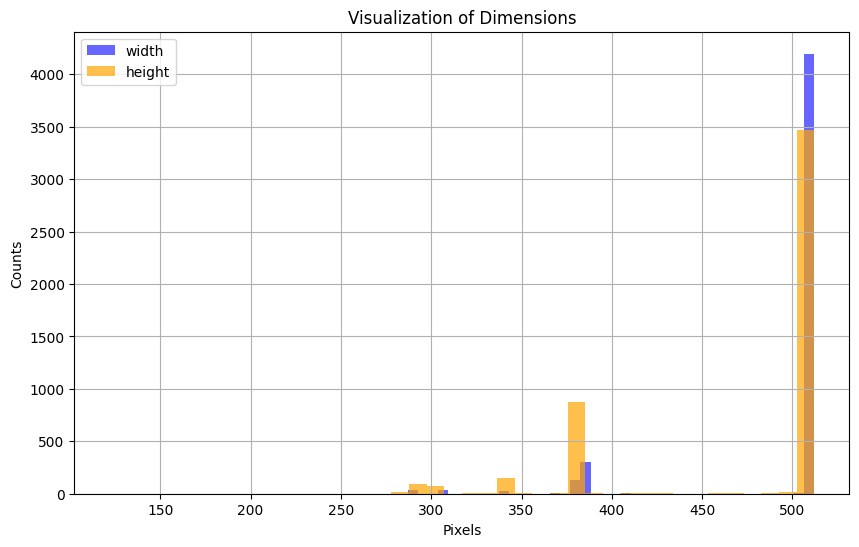

In [8]:
plt.figure(figsize=(10,6))
plt.hist(width,bins=40,alpha=0.6,color='blue',label='width')
plt.hist(height,bins=40,alpha=0.7,color='orange',label='height')
plt.xlabel("Pixels")
plt.ylabel("Counts")
plt.grid(True)
plt.legend()
plt.title("Visualization of Dimensions")
plt.show()

In [9]:
print(f"Values of width: \n{pd.Series(width).value_counts()}")
print(f"Length of Different width: {len(pd.Series(width).value_counts())}")


Values of width: 
512    4171
384     290
382     126
306      24
511      22
289      18
288      16
341      11
383      10
307       7
340       5
410       4
287       3
339       3
418       2
506       2
346       2
342       2
366       2
385       2
391       1
375       1
425       1
427       1
379       1
510       1
475       1
398       1
445       1
509       1
296       1
471       1
407       1
458       1
504       1
486       1
443       1
387       1
380       1
343       1
502       1
494       1
367       1
451       1
409       1
415       1
304       1
454       1
Name: count, dtype: int64
Length of Different width: 48


In [10]:
print(f"Height of Images Values:\n {pd.Series(height).value_counts()}")
print(f"Length of Different Height Values: {len(pd.Series(height).value_counts())}")

Height of Images Values:
 512    3433
384     698
382     139
341      79
306      57
       ... 
418       1
403       1
329       1
491       1
335       1
Name: count, Length: 89, dtype: int64
Length of Different Height Values: 89


<p>Statistical info of width and height</p>

In [11]:
values = {"width":[np.max(width),np.min(width),np.median(width),np.mean(width)],"height":[np.max(height),np.min(height),np.median(height),np.mean(height)]}
stat_values = pd.DataFrame(data=values,index=["max","min","median","mean"])
stat_values

,width,height
max,512.000000,512.000000
min,287.000000,122.000000
median,512.000000,512.000000
mean,495.793474,473.028842


<p><em><b>We should preprocess the images to have the same width and height otherwise we will have problems<b></em></p>

<h4>Aspect Ratio Distribution</h4>

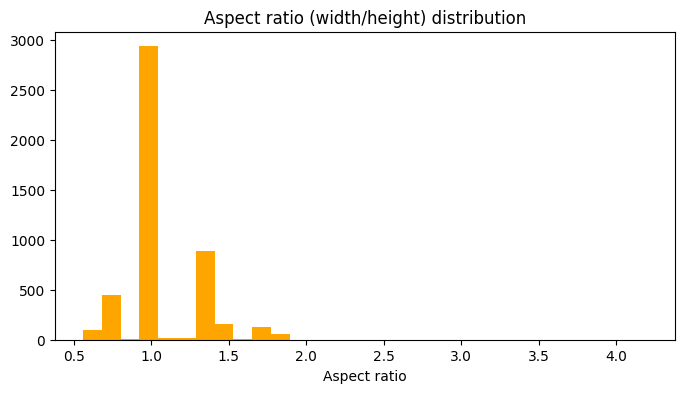

Aspect Ratio Values:1.000000    2854
1.333333     698
0.750000     290
1.340314     139
0.746094     126
            ... 
0.869141       1
0.927734       1
1.190698       1
0.777344       1
1.026052       1
Name: count, Length: 136, dtype: int64
Length of Aspect Ratio: 136


In [12]:
plt.figure(figsize=(8,4))
plt.hist(aspect_ratio, bins=30, color='orange')
plt.title("Aspect ratio (width/height) distribution")
plt.xlabel("Aspect ratio")
plt.show()

print(f"Aspect Ratio Values:{pd.Series(aspect_ratio).value_counts()}")
print(f"Length of Aspect Ratio: {len(pd.Series(aspect_ratio).value_counts()) }")


<p>Most of the images are squared (have same width and height) , but we have a variaty of images that are either wide or tall </p>

<h4>Resolution Histogram visualization</h4>


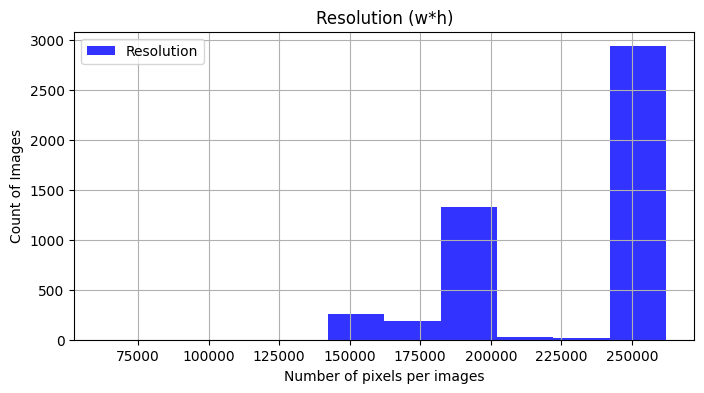

Minimum Resolution: 62464
Maximum Resolution: 262144


In [13]:
plt.figure(figsize=(8,4))
plt.hist(resolution,color='blue',label="Resolution",alpha=0.8)
plt.xlabel("Number of pixels per images")
plt.ylabel("Count of Images")
plt.legend()
plt.grid(True)
plt.title("Resolution (w*h)")
plt.show()

print(f"Minimum Resolution: {np.min(resolution)}")
print(f"Maximum Resolution: {np.max(resolution)}")

<p>We can that we have a lot of values that are below 250.000 pixels and that is a problem because we don't have a lot of information</p>

<h4>Outliers Detection</h4>

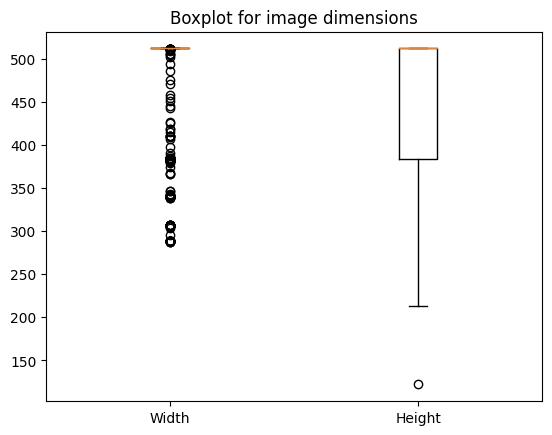

In [14]:

plt.boxplot([width, height], labels=['Width', 'Height'])
plt.title("Boxplot for image dimensions")
plt.show()


In [15]:
#we are going to do transform the list to np.arrays to make it faster
width = np.array(width)
height = np.array(height)

Q1_W,Q3_W = np.percentile(width,[25,75])
IQR_W = Q3_W-Q1_W
lower_bound_W = Q1_W-1.5*IQR_W 
higher_bound_W = Q3_W+1.5*IQR_W

Q1_H , Q3_H = np.percentile(height,[25,75])
IQR_H = Q3_H-Q1_H
lower_bound_H = Q1_H-1.5*IQR_H
higher_bound_H = Q3_H+1.5*IQR_H

print(f"Width bounds: [{lower_bound_W},{higher_bound_W}]")
print(f"Height bounds: [{lower_bound_H},{higher_bound_H}]")


Width bounds: [512.0,512.0]
Height bounds: [192.0,704.0]


In [16]:
outlier_indices = np.where(
    (width < lower_bound_W) | (width > higher_bound_W) |
    (height < lower_bound_H) | (height > higher_bound_H)
)[0]

print("Number of outliers:", len(outlier_indices))
print("Percentage of outliers: ",np.round(len(outlier_indices)*100/len(width),2))

Number of outliers: 580
Percentage of outliers:  12.21


In [17]:
width, height ,aspect_ratio , categories_list , resolution = [], [], [] , [] , []
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    print(f"Processing: {cat}")
    for image_name in os.listdir(folder):
        image_path = os.path.join(folder,image_name)
        try:
            image = PIL.Image.open(image_path)
            w,h = image.size
            if (w < lower_bound_W) | (w > higher_bound_W) \
            | (h < lower_bound_H) | (h > higher_bound_H):
                continue
            width.append(w)
            height.append(h)
            resolution.append(w*h)
            aspect_ratio.append(w/h)
            categories_list.append(cat)
        except:
            continue


Processing: macarons
Processing: french_toast
Processing: lobster_bisque
Processing: prime_rib
Processing: pork_chop


In [18]:
print(f"Number of Images: {(len(width),len(height))}")

Number of Images: (4170, 4170)


<h2>Color & Lighting</h2>

In [19]:
def rgb_mean_cv2(bgr):
    #returns the rgb colors of each image
    #range [0,255]
    rgb = cv2.cvtColor(bgr,cv2.COLOR_BGR2RGB)
    r = rgb[...,0].mean()
    g = rgb[...,1].mean()
    b = rgb[...,2].mean()
    return r,g,b

def bright_contrast_cv2(bgr):
    #returns brightness and contrast per image
    gray = cv2.cvtColor(bgr,cv2.COLOR_BGR2GRAY)
    return gray.mean(), gray.std()




In [20]:
R_total, G_total , B_total = [],[],[]
Bright_total , Contrast_total = [],[]
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    print(f"Processing: {cat}")
    for image_name in os.listdir(folder):
        image_path = os.path.join(folder,image_name)
        try:
            img = cv2.imread(image_path,cv2.IMREAD_COLOR)
            if img is None:
                continue
            h,w,c = img.shape
            if (w < lower_bound_W) | (w > higher_bound_W) \
            | (h < lower_bound_H) | (h > higher_bound_H):
                continue
            r,g,b = rgb_mean_cv2(img)
            br,ct = bright_contrast_cv2(img)    
            R_total.append(r); G_total.append(g); B_total.append(b)
            Bright_total.append(br); Contrast_total.append(ct)
        except:
            continue


Processing: macarons
Processing: french_toast
Processing: lobster_bisque
Processing: prime_rib
Processing: pork_chop


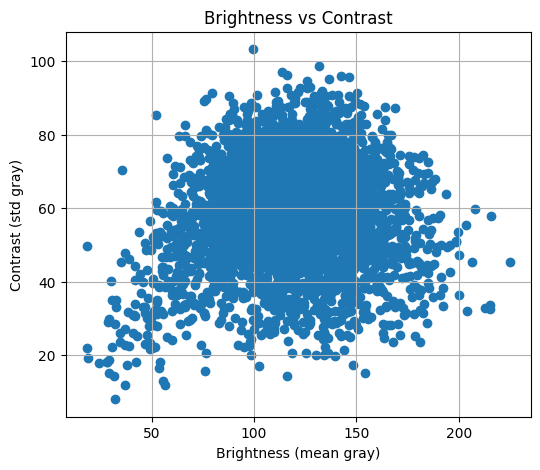

In [21]:
plt.figure(figsize=(6,5))
plt.scatter(Bright_total,Contrast_total)
plt.xlabel("Brightness (mean gray)")
plt.ylabel("Contrast (std gray)")
plt.grid()
plt.title("Brightness vs Contrast")
plt.show()

<p>As we can see a lot of images had close to balanced contrast and brightness except of some exceptions that had or more brightness or more contrast</p>

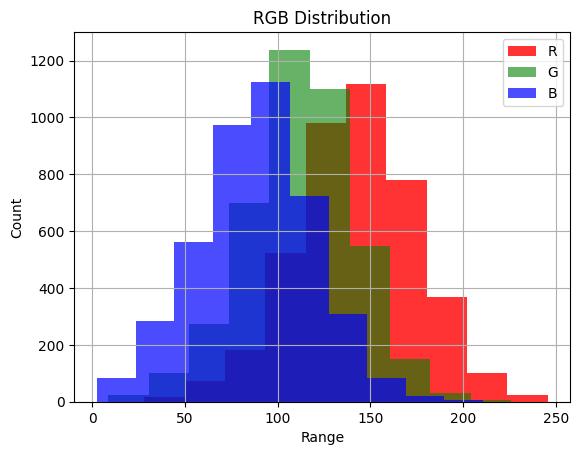

In [22]:
plt.hist(R_total,label='R',alpha=0.8,color='red')
plt.hist(G_total,label='G',alpha=0.6,color='green')
plt.hist(B_total,label='B',alpha=0.7,color='blue')
plt.ylabel("Count")
plt.xlabel("Range")
plt.grid()
plt.legend()
plt.title('RGB Distribution')
plt.show()

<p>A lot of images had more red than the other colors and less blue </p>

<h2>Image Quality Issues</h2>


In [23]:
def laplacian_variance(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    return float(cv2.Laplacian(gray,ddepth=cv2.CV_64F,ksize=3).var())
    

In [24]:
blur_scores = []
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    for image_path in os.listdir(folder):
        image = os.path.join(folder,image_path)
        try:
            img = cv2.imread(image,cv2.IMREAD_COLOR)
            if img is None:
                continue
            h,w,c = img.shape
            if (w < lower_bound_W) | (w > higher_bound_W) \
            | (h < lower_bound_H) | (h > higher_bound_H):
                continue
            score = laplacian_variance(img)
            blur_scores.append(score)
        except:
            continue
            

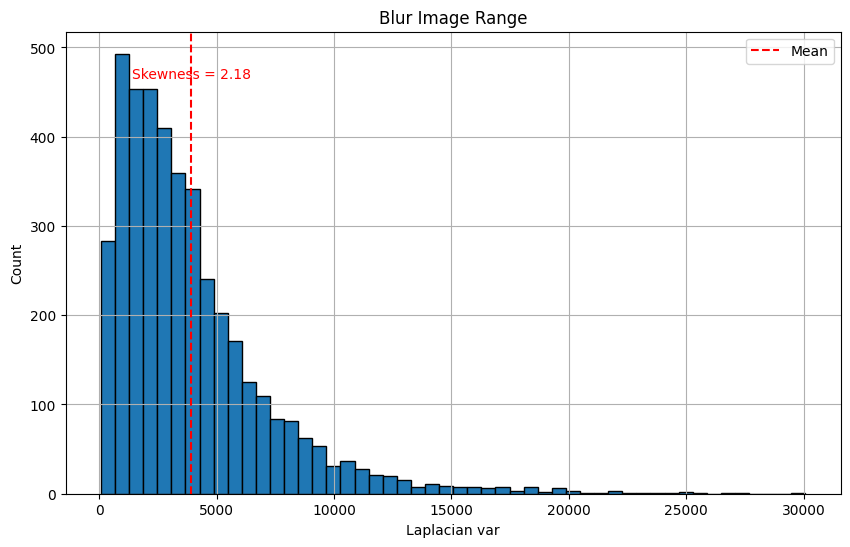

In [25]:
from scipy.stats import skew 

s = skew(blur_scores)

plt.figure(figsize=(10,6))
plt.hist(blur_scores,bins=50,edgecolor='black')
plt.title("Blur Image Range")
plt.grid()
plt.axvline(np.mean(blur_scores), color='red', linestyle='--', label='Mean')
plt.text(np.mean(blur_scores), plt.ylim()[1]*0.9, f"Skewness = {s:.2f}", 
         color='red', fontsize=10, ha='center')
plt.xlabel("Laplacian var")
plt.ylabel("Count")
plt.legend()
plt.show()


<p>Higher Laplacian var = More Sharp images</p></br>
<p>In the plot we can see due to the right skew we have more blurry images rather than sharp images</p>

<h2>Class Distirbution Analysis</h2>

In [26]:
count_per_class= {}
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    if not os.path.isdir(folder):
        counts_per_class[cat] = 0
    else:
        count_per_class[cat] = sum(
            1 for f in os.listdir(folder)
        )



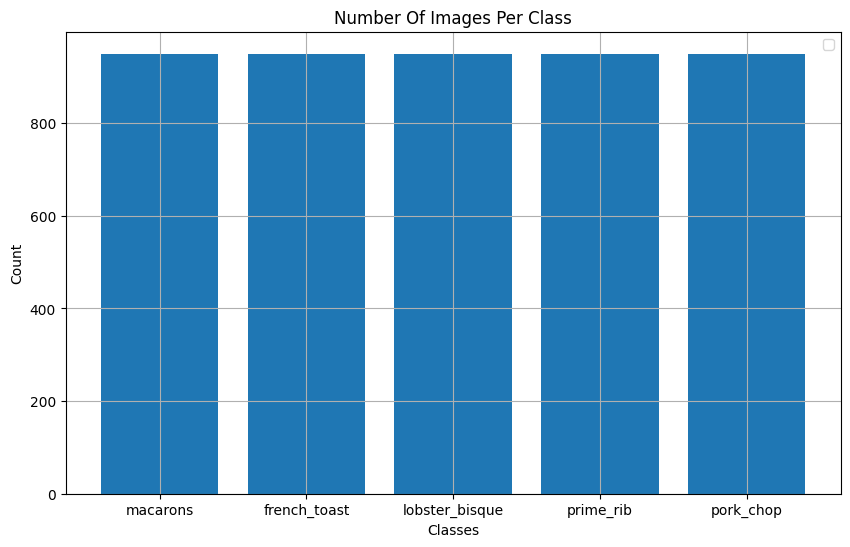

In [27]:
cats = list(count_per_class.keys())
counts_class = [count_per_class[c] for c in cats]

plt.figure(figsize=(10,6))
plt.bar(cats,counts_class)
plt.title("Number Of Images Per Class")
plt.xlabel("Classes")
plt.ylabel("Count")
plt.grid(True)
plt.legend()
plt.show()

In [28]:
for cat in cats:
    print(f"Length of Cat: {count_per_class[cat]}")

Length of Cat: 950
Length of Cat: 950
Length of Cat: 950
Length of Cat: 950
Length of Cat: 950



<p>So we can see an evenly distribution of images all of them have the same size</p>
<p>So the imbalance ratio = 1 so we have balanced ratio</p>

<h2>Preprocessing</h2>

In [29]:
print(f"Width: [{lower_bound_W},{higher_bound_W}]")
print(f"Height: [{lower_bound_H},{higher_bound_H}]")

Width: [512.0,512.0]
Height: [192.0,704.0]


<p>We are going to make the images 512*512</p>

In [30]:
TARGET_SIZE=512

In [31]:
def normalize_img(img,size=512,pad_color=0):
    h ,w = img.shape[:2]
    if w!= TARGET_SIZE:
        aspect_ratio = h/w
        new_h = int(TARGET_SIZE*aspect_ratio)
        img = cv2.resize(img,(TARGET_SIZE,new_h),interpolation=cv2.INTER_AREA)

        h,w = img.shape[:2]
    if h <TARGET_SIZE:
        img = pad_height(img,TARGET_SIZE,pad_color)
    elif h > TARGET_SIZE:
        img = crop_height(img)

    return img

    

def pad_height(img,target,pad_value=0):
    h,w = img.shape[:2]
    if h>= TARGET_SIZE:
        return img 
    padding_needed = TARGET_SIZE-h
    pad_top = padding_needed//2
    pad_bottom = padding_needed-pad_top

    return cv2.copyMakeBorder(img,pad_top,pad_bottom,0,0,cv2.BORDER_CONSTANT,value=(pad_color,pad_color,pad_color))

def crop_height(img):
    h,w = img.shape[:2]
    if h <= TARGET_SIZE:
        return img
    crop_amount = h-TARGET_SIZE
    crop_top = crop_amount//2
    crop_bottom = crop_top+TARGET_SIZE
    return img[crop_top:crop_bottom,:]
    

In [32]:
images = []
pad_color= 0
for cat in top_5_categories:
    folder = os.path.join(DATASET_DIR,cat)
    print(f"Pre-process: {cat}")
    for images_path in os.listdir(folder):
        try:
            image = os.path.join(folder,images_path)
            img = cv2.imread(image,cv2.IMREAD_COLOR)
            if img is None:
                continue
            img_normalized = normalize_img(img,pad_color)
            images.append(img_normalized)
        except Exception as e:
            raise ValueError("Error")
            

Pre-process: macarons
Pre-process: french_toast
Pre-process: lobster_bisque
Pre-process: prime_rib
Pre-process: pork_chop


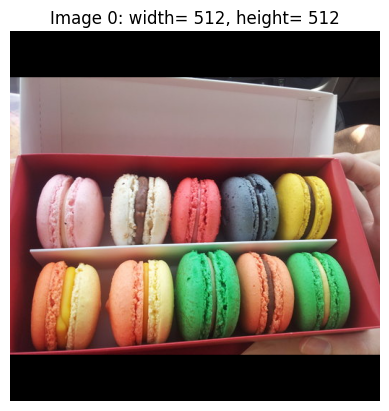

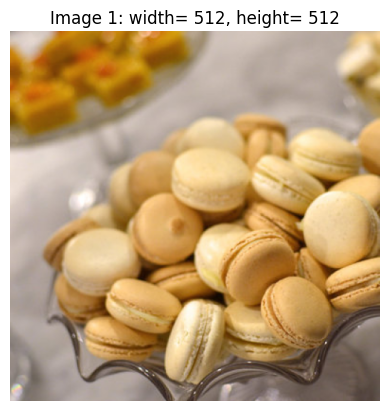

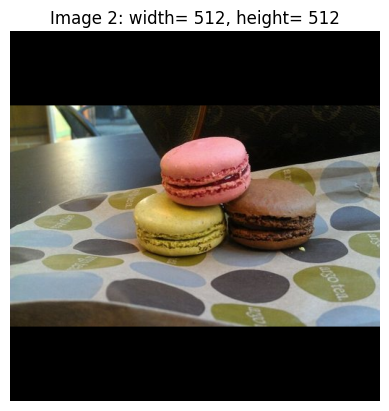

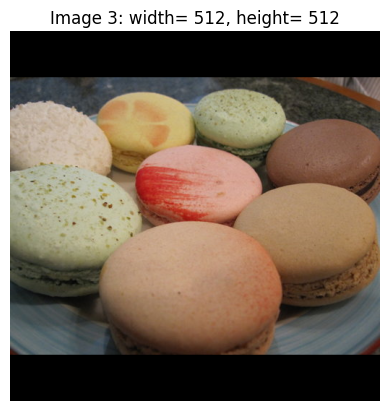

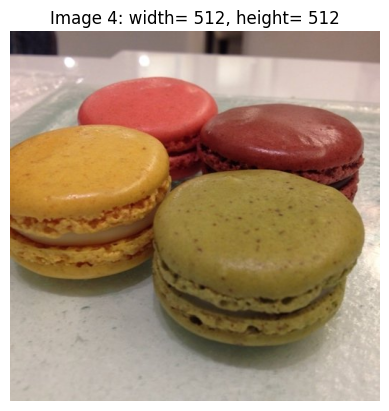

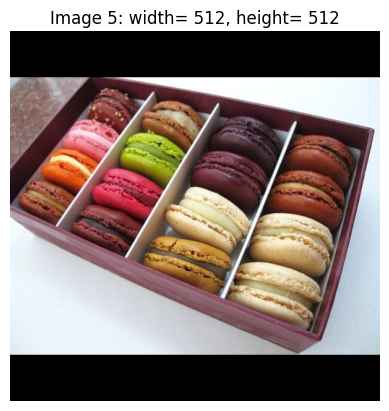

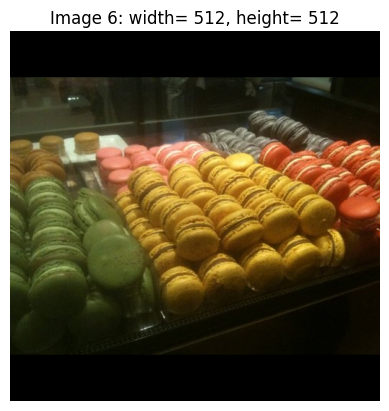

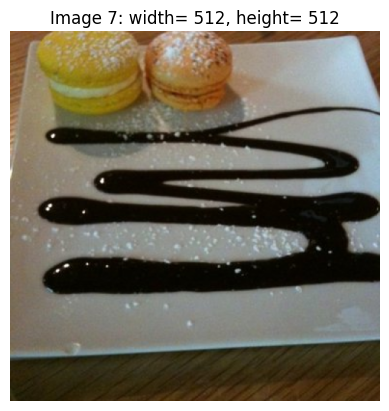

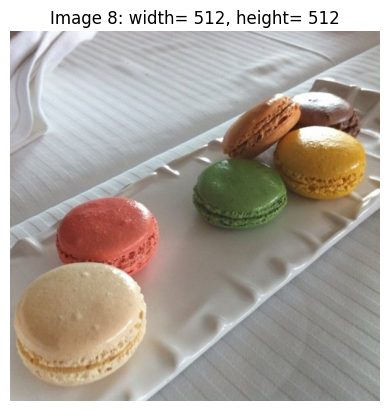

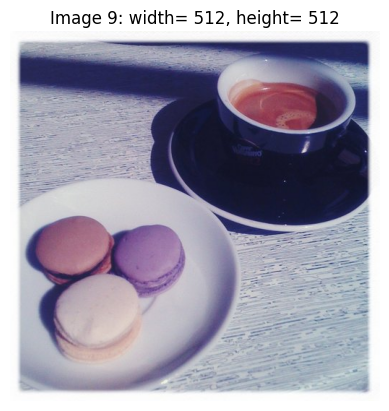

In [33]:
for i,img in enumerate(images[:10]):
    h,w = img.shape[:2]
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.title(f"Image {i}: width= {w}, height= {h}")
    plt.axis("off")
    plt.show()

<p>we scale the images to have aspect ratio =1 , so width and height be the same (512*512)px</p>

In [34]:
def normalize_lighting_clahe(img_bgr, clip_limit=2.0, tile_grid_size=(8,8)):
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l2 = clahe.apply(l)
    lab2 = cv2.merge((l2, a, b))
    return cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

In [35]:
bright_normalise= []
for image in images:
    img_lit = normalize_lighting_clahe(image)
    bright_normalise.append(img_lit)

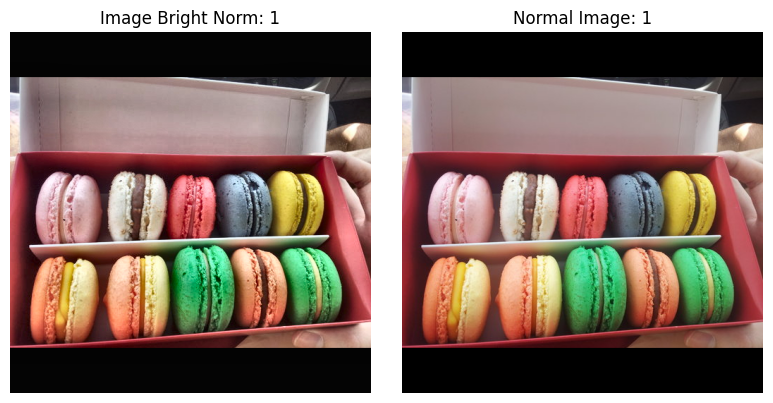

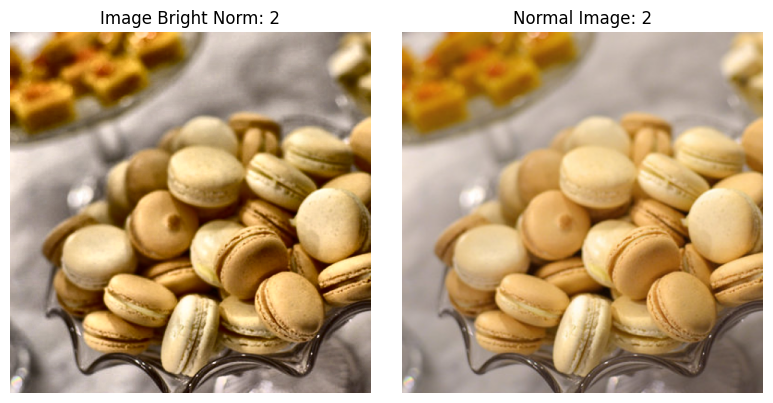

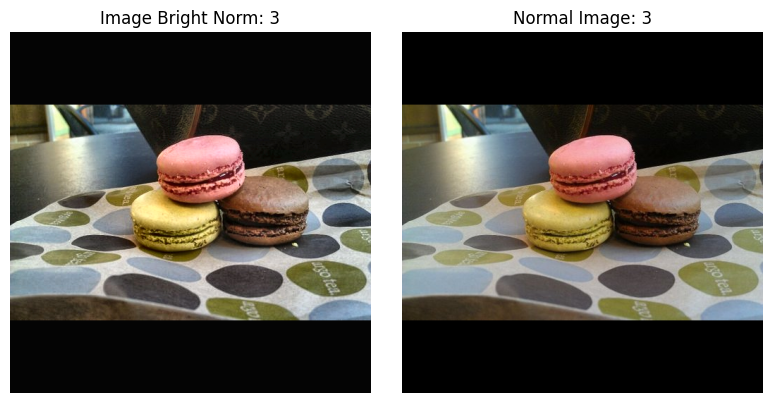

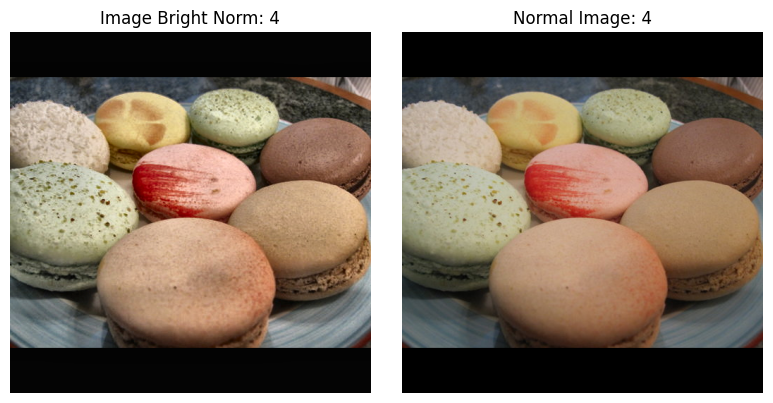

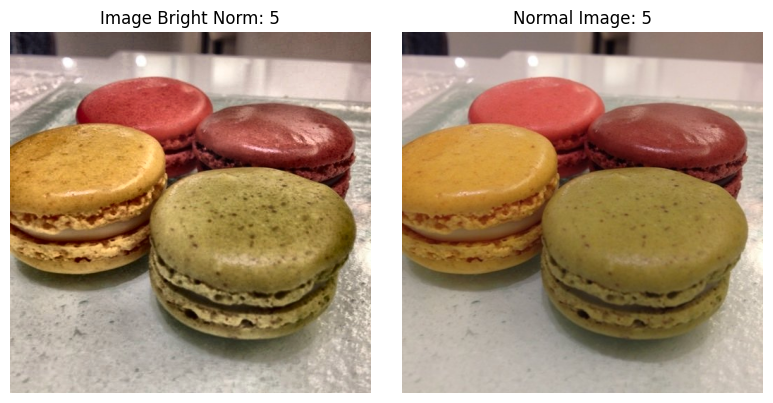

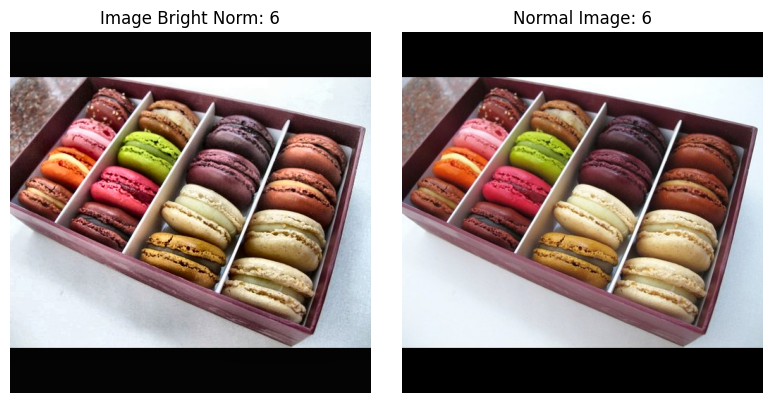

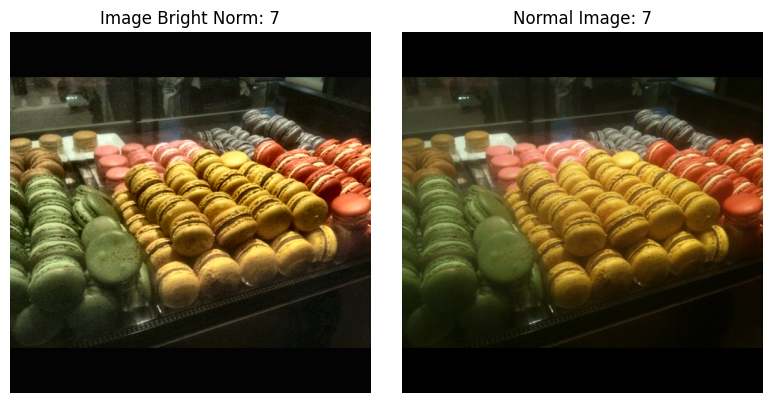

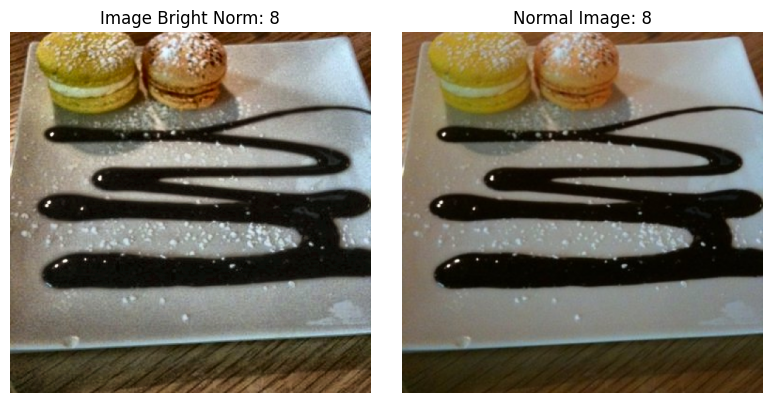

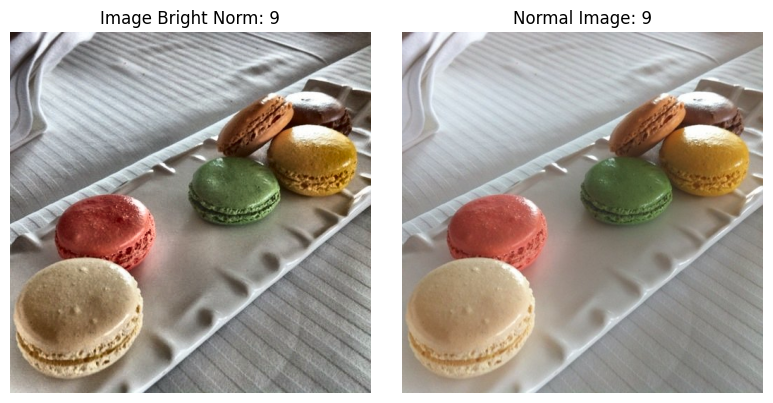

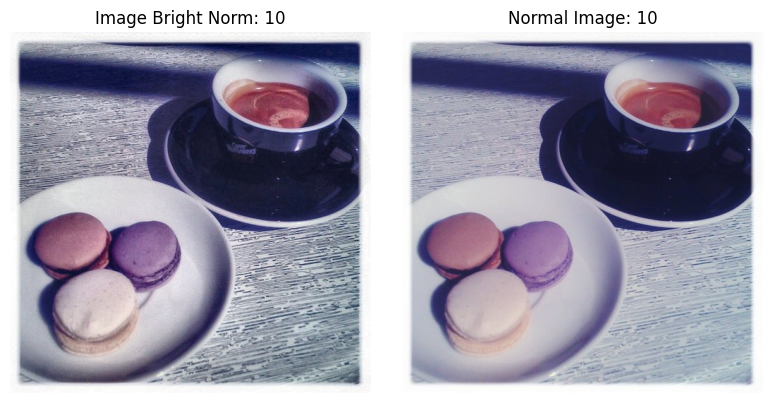

In [36]:
for i, image in enumerate(bright_normalise[:10]):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title(f"Image Bright Norm: {i+1}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(images[i],cv2.COLOR_BGR2RGB))
    plt.title(f"Normal Image: {i+1}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

<h3>Color Normalization</h3>

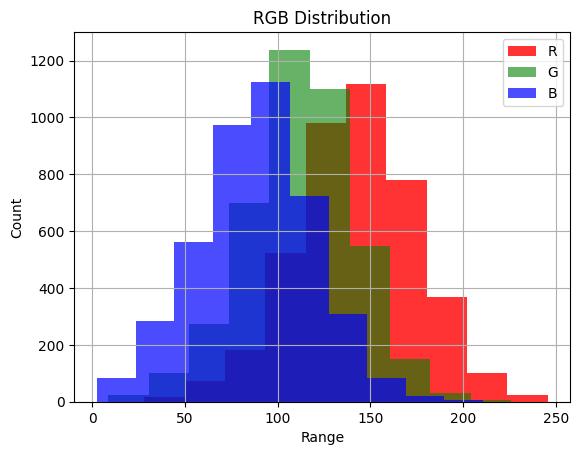

Red: [27.923080444335938,245.69349670410156]
Green: [8.68954086303711,225.78264181634898]
Blue: [2.47393798828125,210.76901245117188]


In [37]:
plt.hist(R_total,label='R',alpha=0.8,color='red')
plt.hist(G_total,label='G',alpha=0.6,color='green')
plt.hist(B_total,label='B',alpha=0.7,color='blue')
plt.ylabel("Count")
plt.xlabel("Range")
plt.grid()
plt.legend()
plt.title('RGB Distribution')
plt.show()
print(f"Red: [{np.min(R_total)},{np.max(R_total)}]")
print(f"Green: [{np.min(G_total)},{np.max(G_total)}]")
print(f"Blue: [{np.min(B_total)},{np.max(B_total)}]")

<p>so as we can see the color red is stronger so most of the images are more "warm"
</p>

In [38]:
def gray_world(img_bgr):
    avg_b , avg_g , avg_r = [img_bgr[...,i].mean() for i in range(3)]
    gray_g = (avg_b+avg_g+avg_r)/3
    scale = [avg_b/gray_g,avg_g/gray_g,avg_r/gray_g]
    b_bal = cv2.multiply(img_bgr[...,0], scale[0])
    g_bal = cv2.multiply(img_bgr[...,1], scale[1])
    r_bal = cv2.multiply(img_bgr[...,2], scale[2])
    balanced = cv2.merge([
        b_bal,
        g_bal,
        r_bal
    ])
    return np.clip(balanced,0,255).astype(np.uint8), b_bal,g_bal,r_bal
    

In [39]:
color_norm_images = []
R_norm , G_norm , B_norm = [], [], []
for image in images:
    col_n_img,b_val,g_val,r_val = gray_world(image)
    color_norm_images.append(col_n_img)
    R_norm.append(r_val)
    G_norm.append(g_val)
    B_norm.append(b_val)

In [40]:
print(f"Red Range: [{np.min(R_norm)},{np.max(R_norm)}]")
print(f"Green Range: [{np.min(G_norm)},{np.max(G_norm)}]")
print(f"Blue Range: [{np.min(B_norm)},{np.max(B_norm)}]")

Red Range: [0,255]
Green Range: [0,255]
Blue Range: [0,255]


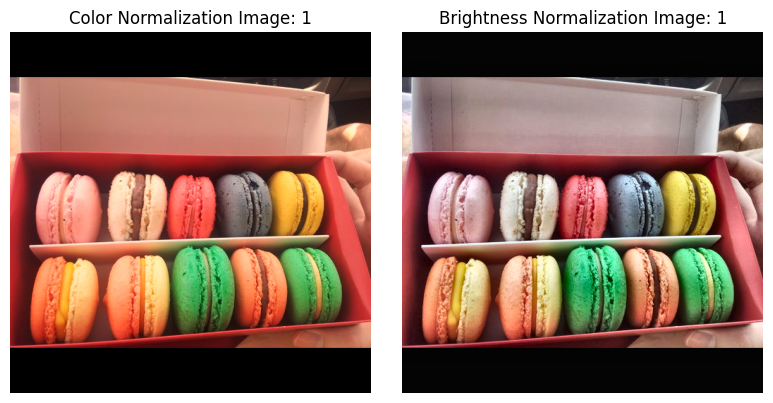

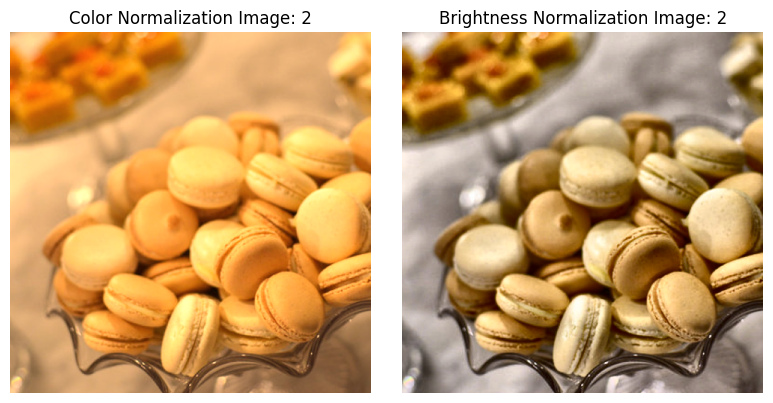

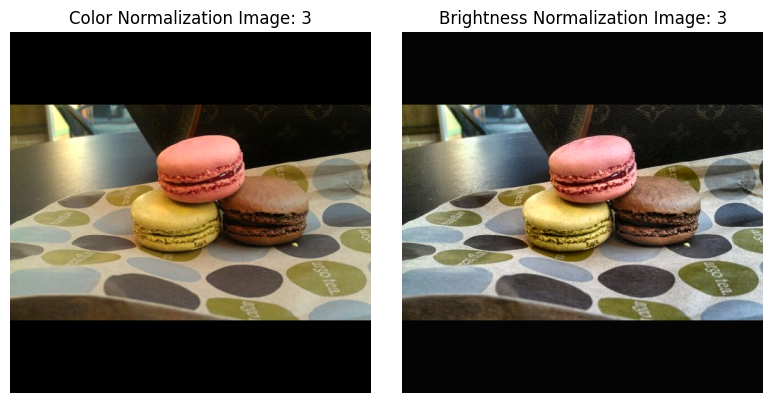

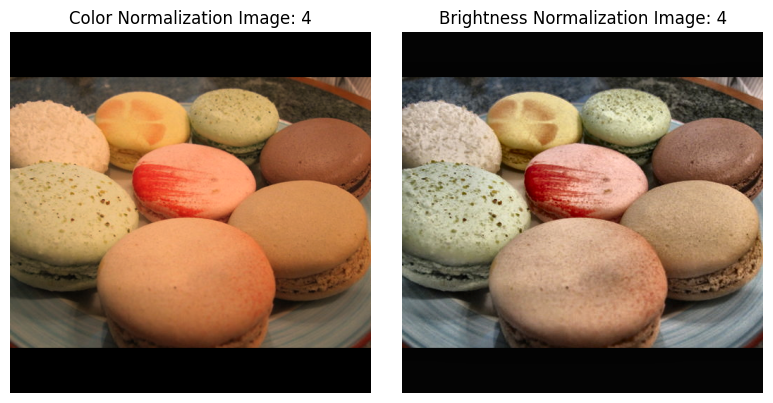

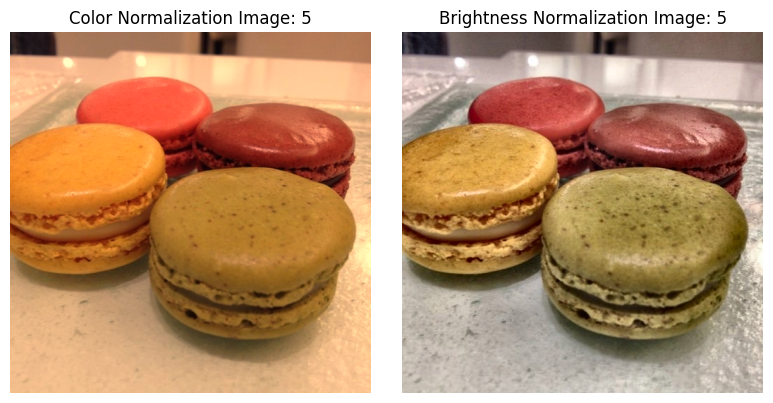

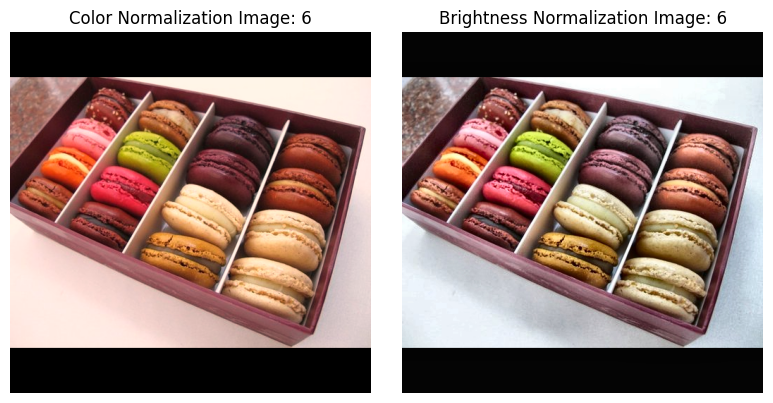

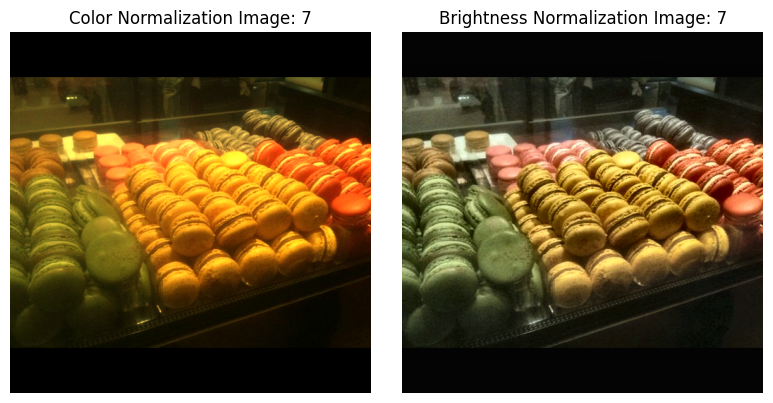

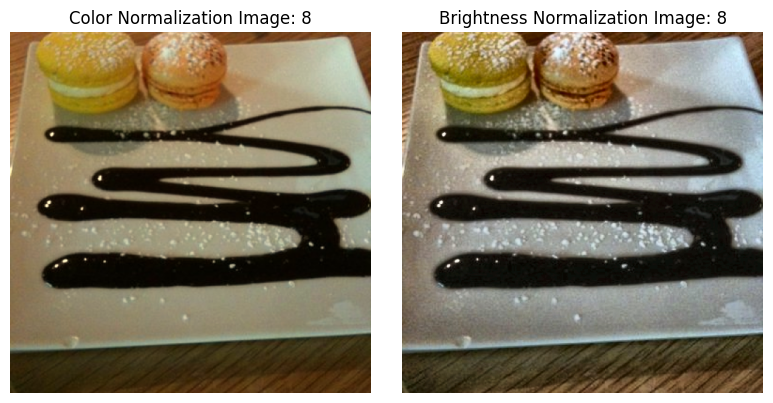

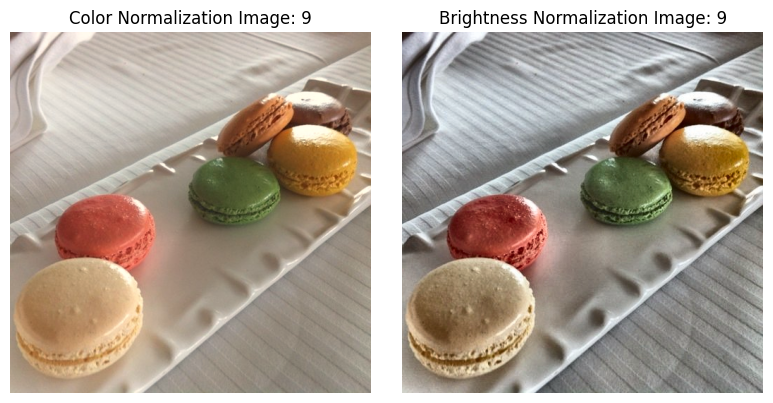

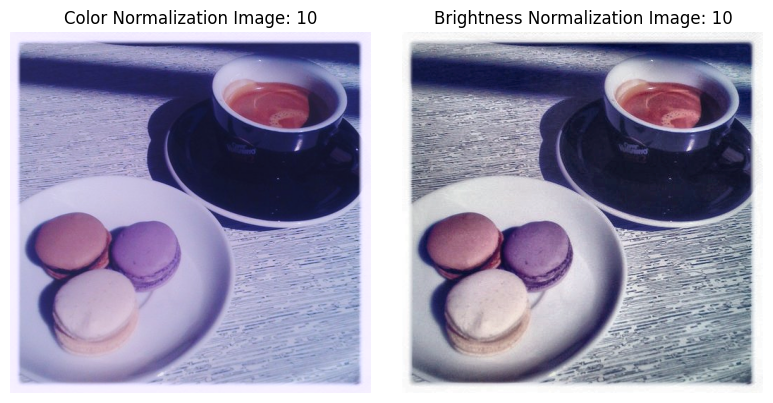

In [41]:
for i,image in enumerate(color_norm_images[:10]):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title(f"Color Normalization Image: {i+1}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(bright_normalise[i],cv2.COLOR_BGR2RGB))
    plt.title(f"Brightness Normalization Image: {i+1}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    

<p>Now as we can see the colors in the image are more balanced and they aren't so warm</p>

<h3>Blur Filtering</h3>

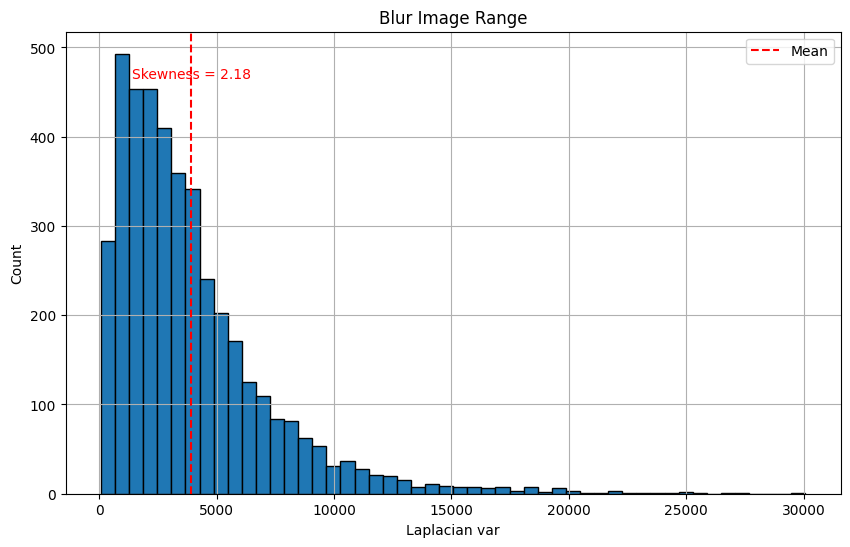

In [42]:
from scipy.stats import skew 

s = skew(blur_scores)

plt.figure(figsize=(10,6))
plt.hist(blur_scores,bins=50,edgecolor='black')
plt.title("Blur Image Range")
plt.grid()
plt.axvline(np.mean(blur_scores), color='red', linestyle='--', label='Mean')
plt.text(np.mean(blur_scores), plt.ylim()[1]*0.9, f"Skewness = {s:.2f}", 
         color='red', fontsize=10, ha='center')
plt.xlabel("Laplacian var")
plt.ylabel("Count")
plt.legend()
plt.show()


<p>As we saw before from the above plot we have more blur images rather than sharp ones so we have to fix this </p>

In [43]:
def laplacian_variance(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    return float(cv2.Laplacian(gray,ddepth=cv2.CV_64F,ksize=3).var())


In [44]:
def unsharp_mask(img, ksize=(5,5), strength=1.5):
    blur = cv2.GaussianBlur(img, ksize, 0)
    sharp = cv2.addWeighted(img, 1 + strength, blur, -strength, 0)
    return sharp

In [45]:
blur_score =[]
img_sharped= []
for image in color_norm_images:
    img = unsharp_mask(image)
    blu = laplacian_variance(img)
    img_sharped.append(img)
    blur_score.append(blu)


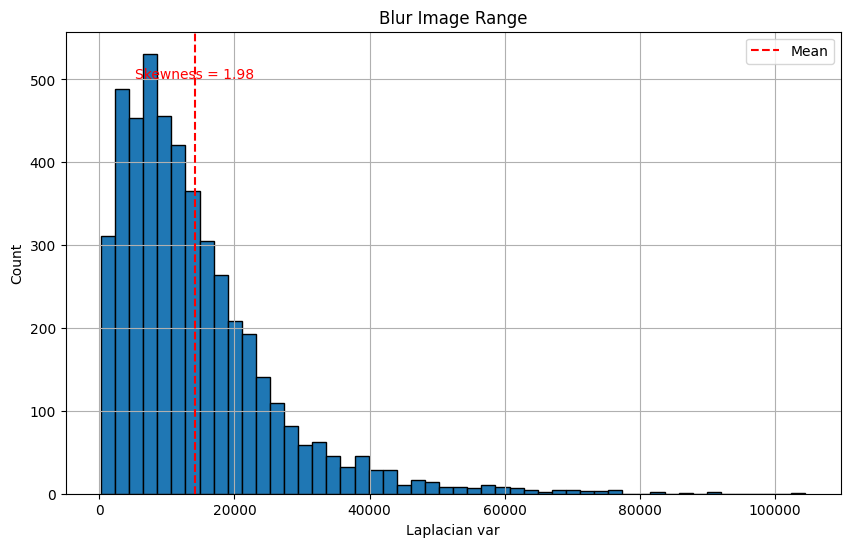

In [46]:
from scipy.stats import skew 

s = skew(blur_score)

plt.figure(figsize=(10,6))
plt.hist(blur_score,bins=50,edgecolor='black')
plt.title("Blur Image Range")
plt.grid()
plt.axvline(np.mean(blur_score), color='red', linestyle='--', label='Mean')
plt.text(np.mean(blur_score), plt.ylim()[1]*0.9, f"Skewness = {s:.2f}", 
         color='red', fontsize=10, ha='center')
plt.xlabel("Laplacian var")
plt.ylabel("Count")
plt.legend()
plt.show()


<h3>Final Scaling</h3>

In [ ]:
print(f"Min- Max Images: [{np.min(img_sharped)},{np.max(img_sharped)}]")

In [ ]:
#we will scale images to be [0.0,1.0]
x_scaled = [img.astype('float32')/255.0 for img in img_sharped]

In [ ]:
print(f"Min:{np.min(x_scaled)}")
print(f"Max:{np.max(x_scaled)}")